# Проект: Как рассказать историю с помощью данных

Цель заключается в исследовании рынка Москвы, чтобы найти интересные особенности и презентовать полученные результаты, которые в будущем помогут инвесторам из фонда «Shut Up and Take My Money» в выборе подходящего места для своего заведения.

План:
- Загрузка данных
- Предобработка 
- Анализ данных
- Детализация исследования
- Презентация

## Загрузка данных

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats as st
sns.set_palette('coolwarm')

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')
display(data.info())
data.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


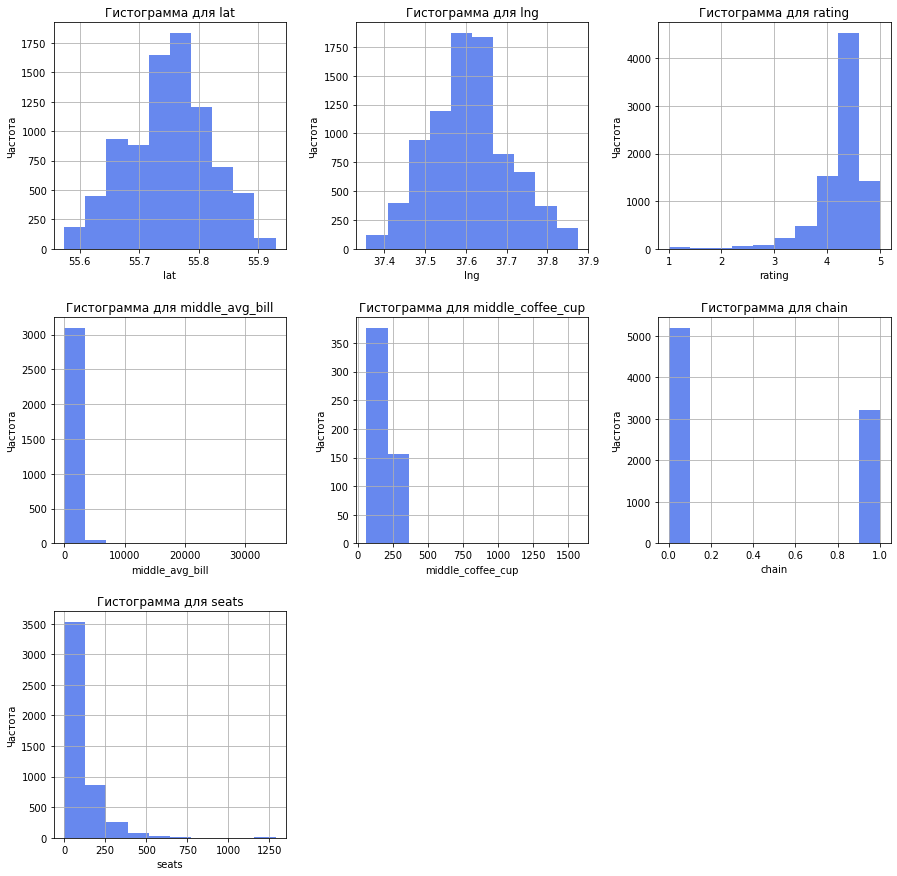

In [3]:
axes = data.hist(figsize=(15, 15))
for ax in axes.flatten():
    ax.set_xlabel(ax.get_title())
    ax.set_ylabel('Частота')  
    ax.set_title(f'Гистограмма для {ax.get_title()}')

In [4]:
data['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [5]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Вывод: В полученных данных 14 столбцов. Встречаются пропуски.

## Предобработка

In [6]:
data.duplicated().sum()

0

In [7]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Явные дупликаты не обнаруженны.

In [8]:
data['name'] = data['name'].str.lower()

In [9]:
data.duplicated(subset=['name', 'address']).sum()

3

In [10]:
data = data.loc[data.duplicated(subset=['name', 'address']) == False]
len(data)

8403

Встретилось 3 неявных дупликата. Смело удаляем.

Пропуски есть, но лучше оставить как есть, чтобы не исказить данные. 

In [11]:
def extract_street(address):
    return address.split(', ')[1]
data['street'] = data['address'].apply(extract_street)

Создадили столбец с улицами.

In [12]:
data['hours'] = data['hours'].fillna('None')
def time(hours):
    if 'ежедневно' in hours and 'круглосуточно' in hours:
        return True
    else:
        return False
data['is_24_7'] = data['hours'].apply(time)
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


Созлали столбец с с обозначением, что заведение работает ежедневно и круглосуточно.

Вывод: Явные дупликаты не обнаружены. Пропуски есть, но, чтобы не исказить данные, их оставляем. Для удобства добавили два столбца.

## Анализ данных

### Категории заведений

,category,address
0,кафе,2377
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


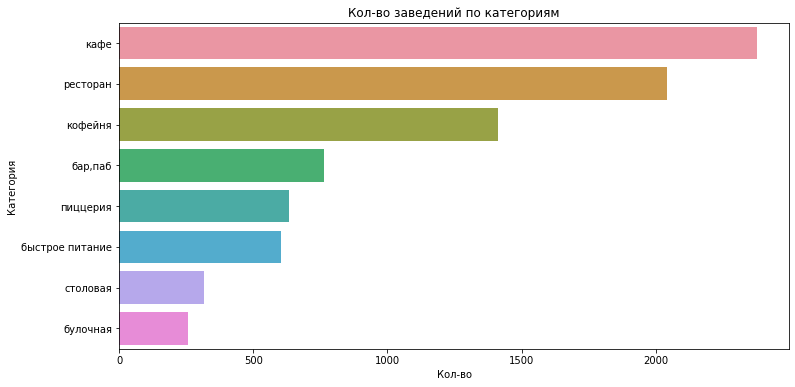

In [13]:
category_data = data.groupby('category').agg({'address' : 'count'}).sort_values(by='address', ascending=False).reset_index()
display(category_data)
plt.figure(figsize=(12, 6))
category_barplot = sns.barplot(y="category", x="address", data=category_data)
category_barplot.set_title('Кол-во заведений по категориям')
category_barplot.set_ylabel('Категория')
category_barplot.set_xlabel('Кол-во');

Вывод: В датасете встречаются 7 категорий. Самое большое кол-во заведений состовляют кафе и рестораны (2378 и 2043 соответственно). Реже всего встречаются столовые и булочные (315 и 256 соответственно).

### Количество посадочных мест

,category,seats
0,ресторан,86.0
1,"бар,паб",82.0
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


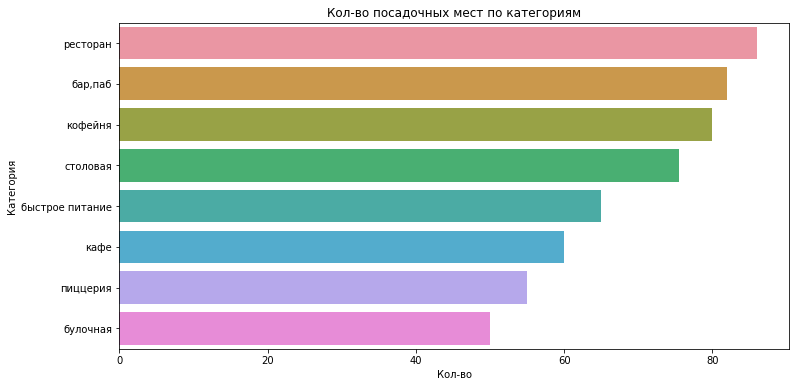

In [14]:
seats_data = data.groupby('category').agg({'seats' : 'median'}).sort_values(by='seats', ascending=False).reset_index()
display(seats_data)
plt.figure(figsize=(12, 6))
seats_barplot = sns.barplot(y="category", x="seats", data=seats_data)
seats_barplot.set_title('Кол-во посадочных мест по категориям')
seats_barplot.set_ylabel('Категория')
seats_barplot.set_xlabel('Кол-во');

Вывод: В среднем в заведениях от 50 до 86 посадочных мест. Самое большое кол-во среди ресторанов, баров и кофеен (80-86 мест). Меньше всего в пиццериях и булочных (50-55 мест).

### Cоотношение сетевых и несетевых заведений

,chain,address
0,0,5200
1,1,3203


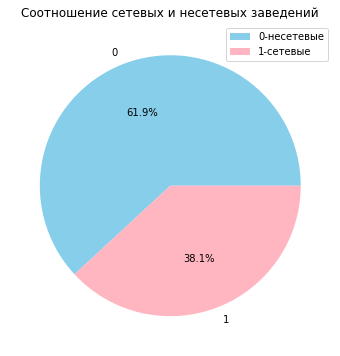

In [15]:
chain_data = data.groupby('chain').agg({'address' : 'count'}).sort_values(by='address', ascending=False).reset_index()
display(chain_data)
chain_data.plot(kind='pie', y='address', autopct='%1.1f%%', colors=['skyblue', 'lightpink'], figsize=(6, 6));
plt.title('Соотношение сетевых и несетевых заведений')
plt.legend(['0-несетевые', '1-сетевые'])
plt.ylabel('');

Вывод: Большая часть заведений является несетевыми (61.9%), сетевых же - 38.1%.

### Сетевые заведений

,category,non_chain,chain,ratio
1,булочная,99,157,61.328125
5,пиццерия,303,330,52.132701
4,кофейня,693,720,50.955414
2,быстрое питание,371,232,38.474295
6,ресторан,1313,729,35.700294
3,кафе,1598,779,32.772402
7,столовая,227,88,27.936508
0,"бар,паб",596,168,21.989529


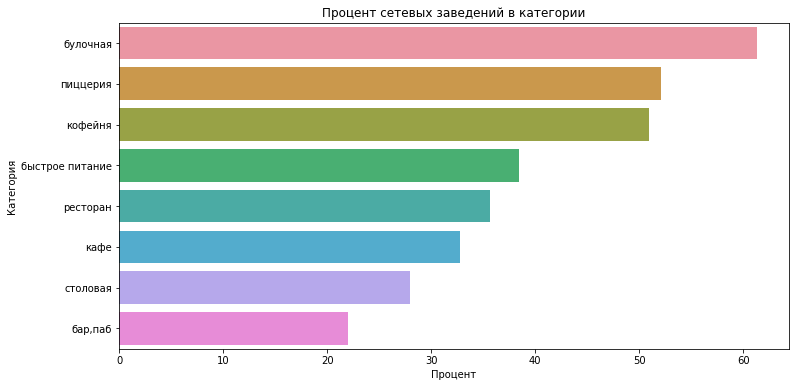

In [16]:
category_chain = data.pivot_table(index='category', columns='chain', values='address', aggfunc='count').reset_index()
category_chain.columns = ['category', 'non_chain', 'chain']
category_chain['ratio'] = category_chain['chain'] / (category_chain['chain'] + category_chain['non_chain']) * 100
category_chain = category_chain.sort_values(by='ratio', ascending=False)
display(category_chain)
plt.figure(figsize=(12, 6))
category_chain_barplot = sns.barplot(x='ratio', y='category', data=category_chain)
category_chain_barplot.set_title('Процент сетевых заведений в категории')
category_chain_barplot.set_ylabel('Категория')
category_chain_barplot.set_xlabel('Процент');

Вывод: Чаще всего сетевые заведения встречаются в категориях: булочная, пиццерия и кофейня (61%, 52%, 51% соответственно). Реже среди столовых и баров (28%, 22% соответственно).

### Топ-15 популярных сетей в Москве

,name,address
0,кафе,189
1,шоколадница,120
2,домино'с пицца,77
3,додо пицца,74
4,one price coffee,72
5,яндекс лавка,69
6,cofix,65
7,prime,50
8,хинкальная,44
9,шаурма,43


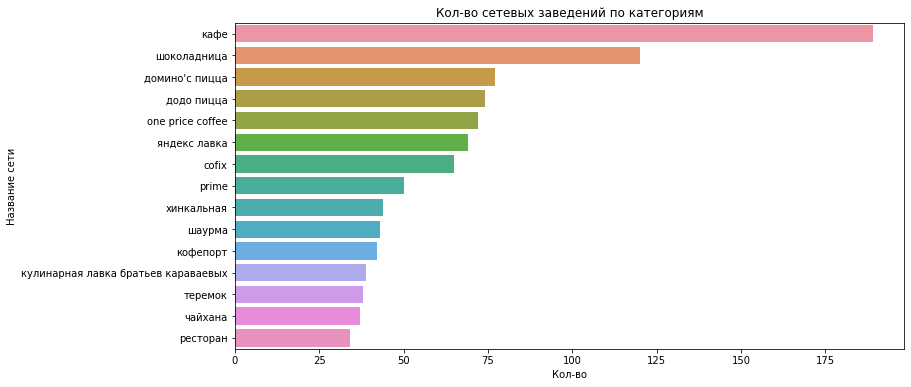

In [17]:
name_data = data.groupby('name').agg({'address' : 'count'}).sort_values(by='address', ascending=False).reset_index()
name_data = name_data.query('name not in ["Кафе", "Ресторан", "Хинкальная", "Шаурма", "Столовая"]').head(15)
display(name_data)
plt.figure(figsize=(12, 6))
name_data_barplot = sns.barplot(x='address', y='name', data=name_data)
name_data_barplot.set_title('Кол-во сетевых заведений по категориям')
name_data_barplot.set_ylabel('Название сети')
name_data_barplot.set_xlabel('Кол-во');

Вывод: В топе 15 в основном встречаются кофейни и пиццерии. Больше всего заведений в регионе у Шоколадницы - 120. Пиццерии имеют около 75 заведений.

### Районы датасета

In [18]:
data['district'].nunique()

9

In [19]:
category_district = data.pivot_table(index='district', columns='category', values='address', aggfunc='count')
display(category_district)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40
Западный административный округ,50,37,62,238,150,71,218,24
Северный административный округ,68,39,58,235,193,77,188,41
Северо-Восточный административный округ,62,28,82,269,159,68,182,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,428,113,670,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Южный административный округ,68,25,85,264,131,73,202,44


Всего заведений:  8403


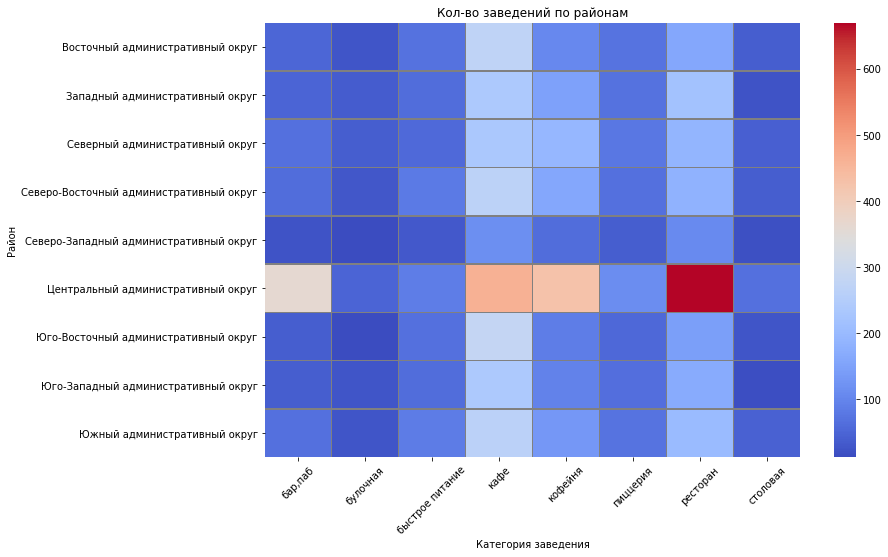

In [20]:
print('Всего заведений: ', len(data))
plt.figure(figsize=(12, 8))
sns.heatmap(category_district, cmap='coolwarm', linewidths=0.5, linecolor='gray');
plt.title('Кол-во заведений по районам')
plt.xlabel('Категория заведения')
plt.xticks(rotation=45)
plt.ylabel('Район');

Вывод: В датасете присутствует 9 районов. Самое большое кол-во заведений в Центральном административном округе. Особенно много ресторанов, баров, кофеен и кафе. Почти во всех регионах кафе и рестораны встречаются чаще других заведений.

### Распределение средних рейтингов по категориям заведений

,category,rating
0,"бар,паб",4.387696
1,пиццерия,4.301264
2,ресторан,4.290402
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.123896
7,быстрое питание,4.050249


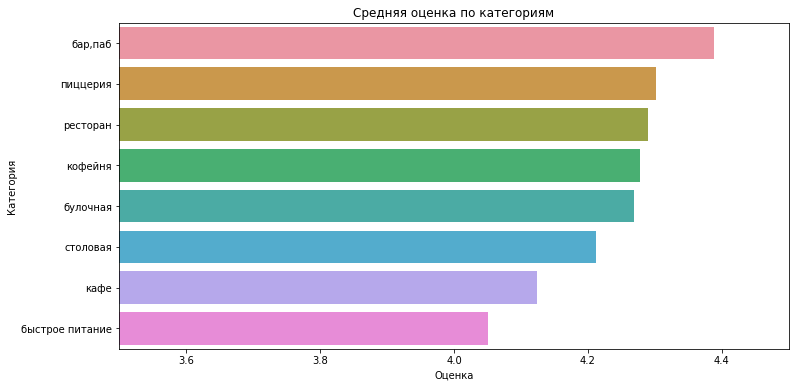

In [21]:
category_rating = data.groupby('category').agg({'rating' : 'mean'}).sort_values(by='rating', ascending=False).reset_index()
display(category_rating)
plt.figure(figsize=(12, 6))
category_rating_barplot = sns.barplot(x='rating', y='category', data=category_rating)
category_rating_barplot.set_title('Средняя оценка по категориям')
category_rating_barplot.set_ylabel('Категория')
category_rating_barplot.set_xlabel('Оценка')
category_rating_barplot.set_xlim(3.5, 4.5);

Вывод: Рейтинги среди заведений не сильно отличаются друг от друга (4.05 - 4.4). Самые высокие в основном в барах, а низкие в заведениях быстрого питания.

### Хороплет

In [22]:
rating_data = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_data

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181647
2,Северный административный округ,4.239822
3,Северо-Восточный административный округ,4.147978
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [23]:
from folium import Map, Choropleth, Marker

state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

Вывод: Рейтинг варируется от 4.1 до 4.4 среди районов. Самые высокие оценки встречаются в Центральном административном округе, а самые низкие в Юго-Восточном.

### Все заведения датасета на карте

In [24]:
from folium.plugins import MarkerCluster

moscow_lat, moscow_lng = 55.751244, 37.618423

m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

marker_cluster = MarkerCluster().add_to(m1)


def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

m1

Вывод: Чем ближе к центру, тем больше заведений.

### Топ-15 улиц по количеству заведений

In [25]:
# найдем топ 15
top_street = data.pivot_table(index='street', values='address', aggfunc='count')\
.sort_values(by='address', ascending=False).reset_index().head(15)
# сохраним список улиц из топа
streets = top_street['street']
# отберем улицы из списка
category_street = data.pivot_table(index='street', columns='category', values='address', aggfunc='count')\
.reset_index().query('street in @streets')

category_street.set_index('street', inplace=True)

display(category_street)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0
МКАД,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0


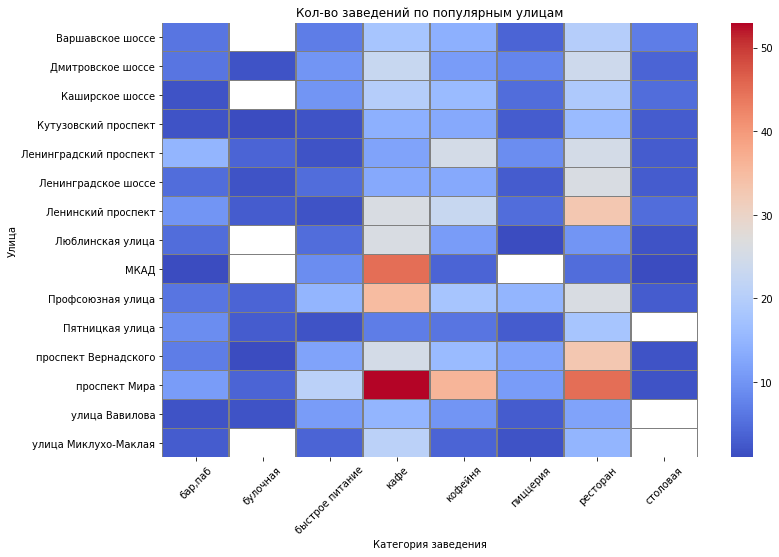

In [26]:
plt.figure(figsize=(12, 8))
sns.heatmap(category_street, cmap='coolwarm', linewidths=0.5, linecolor='gray');
plt.title('Кол-во заведений по популярным улицам')
plt.xlabel('Категория заведения')
plt.xticks(rotation=45)
plt.ylabel('Улица');

Вывод: Больше всего заведений на проспекте Мира. Особенно кафе - 53 заведения.

### Улицы c одним объектом общепита

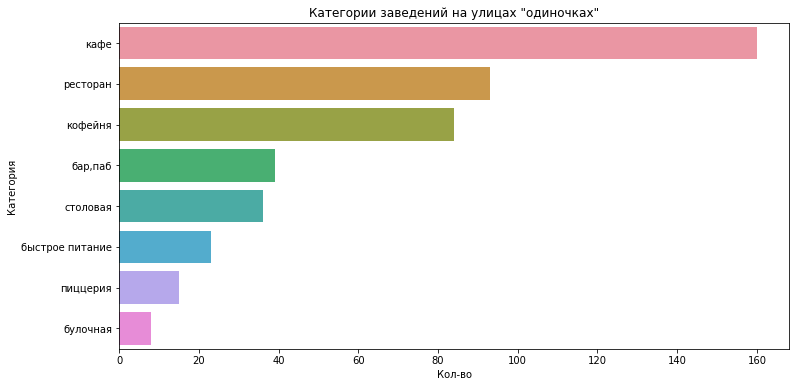

In [27]:
solo_street = data.pivot_table(index='street', values='address', aggfunc='count')\
.sort_values(by='address').reset_index()

solo_streets = solo_street.query('address == 1')['street']

solo_data = data.query('street in @solo_streets')
solo = solo_data.pivot_table(index='category', values='address', aggfunc='count')\
.sort_values(by='address', ascending=False).reset_index()

plt.figure(figsize=(12, 6))
solo_barplot = sns.barplot(x='address', y='category', data=solo)
solo_barplot.set_title('Категории заведений на улицах "одиночках"')
solo_barplot.set_ylabel('Категория')
solo_barplot.set_xlabel('Кол-во');

In [28]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

marker_cluster = MarkerCluster().add_to(m2)


def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

solo_data.apply(create_clusters, axis=1)

m2

Вывод: Улицы только с одним заведениям встречаются по всему региону. Чаще всего на таких улицах расположены только кафе.

### Средние чеки заведений

In [29]:
district_bill = data.groupby('district').agg({'middle_avg_bill' : 'median'})\
.sort_values(by='middle_avg_bill', ascending=False).reset_index()
display(district_bill)

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [30]:
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=district_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m3)

m3

Вывод: Самые дорогие чеки встречаются в Центральном и Западном округе (1000р.). Дешевле всего в Северо-Восточном, Юго-Восточном и Южном (450-500 р.)

### Вывод по анализу

Самые распространенные заведения - это кафе, рестораны и кофейни. Среднее кол-во мест в заведениях от 50 до 85. Несетевых объектов общественного питания больше. Сетевые чаще встречаются среди кофеен и пиццерий. Рейтинги среди категорий заведений несильно отличаются (4.05 - 4.4). В датасете 9 районов, и в каждом районе самые распространенные заведения - это кафе и рестораны. Самый высокий рейтинг заведений в Центральном округе. Также там самый большой средний чек. Чем ближе к центру, тем больше встречается заведений.

## Детализация исследования

### Кол-во кофеен

Всего кофеен:  1413


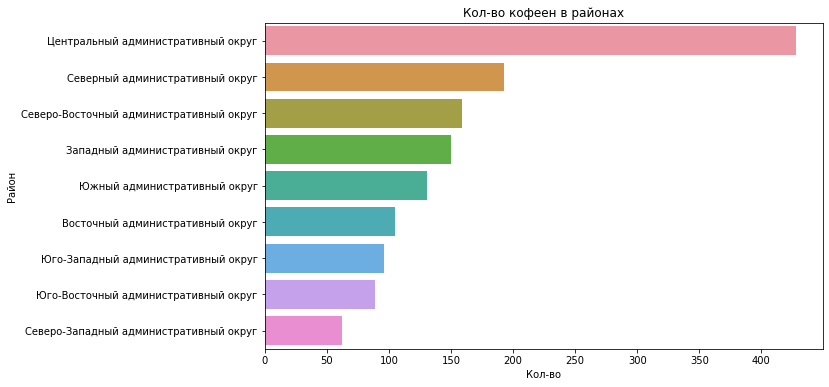

In [31]:
coffee_data = data.query('category == "кофейня"')
print('Всего кофеен: ', len(coffee_data))

coffee_district = coffee_data.groupby('district').agg({'address' : 'count'})\
.sort_values(by='address', ascending=False).reset_index()

plt.figure(figsize=(10, 6))
coffee_district_barplot = sns.barplot(x='address', y='district', data=coffee_district)
coffee_district_barplot.set_title('Кол-во кофеен в районах')
coffee_district_barplot.set_ylabel('Район')
coffee_district_barplot.set_xlabel('Кол-во');

Вывод: Всего кофеен в датасете 1413. Чаще всего они встречаются в Центральном административном округе (почти треть от всех кофеен). В остальных районах от 50 до 200 заведений.

### Круглосуточные кофейни

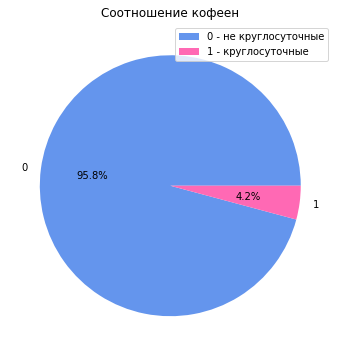

In [32]:
coffee_24_7 = coffee_data.groupby('is_24_7').agg({'address' : 'count'})\
.sort_values(by='address', ascending=False).reset_index()

coffee_24_7.plot(kind='pie', y='address', autopct='%1.1f%%', colors=['cornflowerblue', 'hotpink'], figsize=(6, 6));
plt.title('Соотношение кофеен')
plt.legend(['0 - не круглосуточные', '1 - круглосуточные'])
plt.ylabel('');

Вывод: Круглосуточные кофейни встречаются, но они очень редки (4.2% от всех).

### Рейтинги кофеен

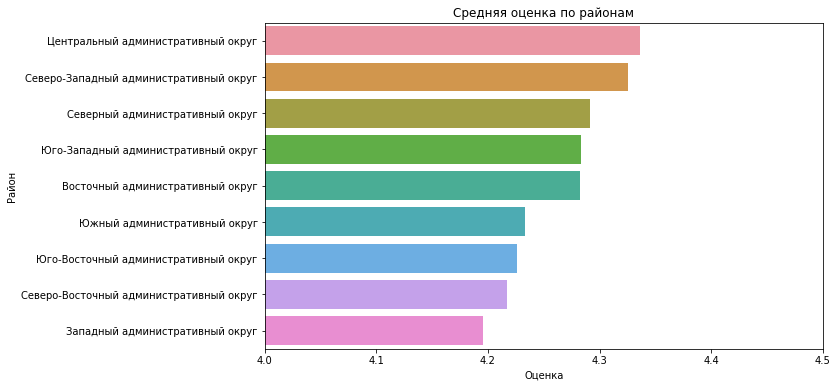

In [33]:
rating_coffee = coffee_data.groupby('district').agg({'rating' : 'mean'})\
.sort_values(by='rating', ascending=False).reset_index()

plt.figure(figsize=(10, 6))
rating_coffee_barplot = sns.barplot(x='rating', y='district', data=rating_coffee)
rating_coffee_barplot.set_title('Средняя оценка по районам')
rating_coffee_barplot.set_ylabel('Район')
rating_coffee_barplot.set_xlabel('Оценка')
rating_coffee_barplot.set_xlim(4, 4.5);

Вывод: Рейтинги несильно отличаются в районах (от 4.19 до 4.35). Самый высокие в Центральном и Северо-Западном.

### Стоимость чашки капучино

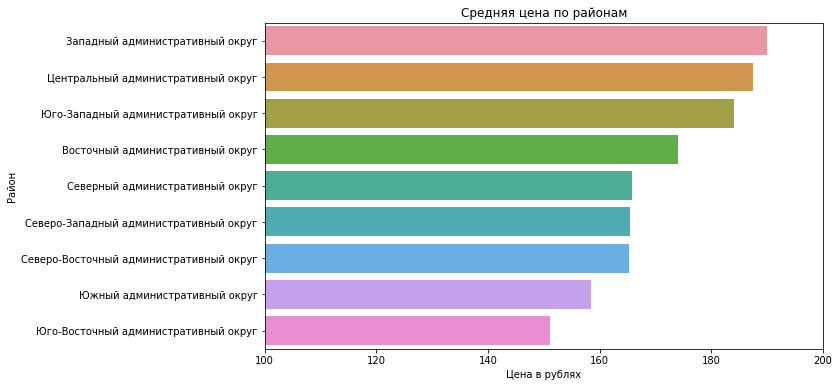

In [34]:
price_coffee = coffee_data.groupby('district').agg({'middle_coffee_cup' : 'mean'})\
.sort_values(by='middle_coffee_cup', ascending=False).reset_index()

plt.figure(figsize=(10, 6))
price_barplot = sns.barplot(x='middle_coffee_cup', y='district', data=price_coffee)
price_barplot.set_title('Средняя цена по районам')
price_barplot.set_ylabel('Район')
price_barplot.set_xlabel('Цена в рублях')
price_barplot.set_xlim(100, 200);

Вывод: Средняя стоимость чашки капучино в городе от 150 до 190 рублей. Дороже всего выходит в Западном, Центральном и Юго-Западном районе. Дешевле - в Юго-Восточном

### Вывод

Самые популярные заведения: кафе, рестораны и кофейни. Это значит, что они пользуются большим спросом, поэтому стоит рассмотреть эти категории. В Центральном административном округе открыто уже довольно большое кол-во кафе. Конкуренция будет очень высокая, поэтому важно, чтобы у заведения была уникальная концепция. В других же районах может быть низкий трафик. Оптимальное кол-во мест от 50 для комфортного обслуживания клиентов. Круглосуточных кофеен довольно мало. Возможно, это будет уникальной фишкой для заведения. Рейтинги отличаются несильно и они довольно высокие, поэтому клиенты будут ожидать высокого уровня обслуживания. Цена за чашку кофе не должна отличаться сильно от среднего значения (150-190 рублей), чтобы справиться с конкуренцией.

## Презентация

Презентация: https://disk.yandex.ru/d/r08Ccqa38rd9ng